In [1]:
paths = {
    'win10': '',
    'win11': r'C:\Users\Administrator\Downloads\ML',
}

file = r'\accidents.csv'

In [2]:
import platform

windows_version = platform.release()

if windows_version.startswith("10"):
    path = paths['win10']
elif windows_version.startswith("11"):
    path = paths['win11']

In [3]:
file_path = path + file

In [4]:
import polars as pl
import panel as pn
import hvplot.pandas
import hvplot.polars
import pandas as pd

In [5]:
accidents_df = pl.read_csv(file_path, 
                 dtypes={'local_authority_ons_district': str}, 
                 ignore_errors=True, 
                 null_values=['NULL']
                 )

In [6]:
invalid_date_rows = accidents_df.filter(pl.col('date').str.len_bytes() != 10)

# Check for any invalid date rows and print them
if not invalid_date_rows.is_empty():
    print("Rows with invalid dates:")
    print(invalid_date_rows)
else:
    print("No invalid date rows found.")

No invalid date rows found.


In [6]:
# Convert date and time columns to datetime and time format
# Correct the date format and set `strict=False` to handle conversion issues
accidents_df = accidents_df.with_columns([
    pl.col('date').str.strptime(pl.Date, format='%d/%m/%Y', strict=False),
    pl.col('time').str.strptime(pl.Time, format='%H:%M', strict=False)
])

In [8]:
# Extract the year from the parsed date column
accidents_df = accidents_df.with_columns(
    pl.col('date').dt.year().alias('year')
)

In [31]:
accidents_df.describe()

statistic,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
str,str,f64,str,f64,f64,str,str,f64,f64,f64,f64,str,f64,str,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""count""","""8809915""",8.809915e6,"""8809915""",8.798253e6,8.798253e6,"""3922484""","""3922484""",8.809915e6,8.809915e6,8.809915e6,8.809915e6,"""8809907""",8.809915e6,"""8809907""",8.809915e6,"""8809915""",3.760363e6,8.809915e6,8.809915e6,8.809915e6,8.809878e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,8.809915e6,5.202448e6
"""null_count""","""0""",0.0,"""0""",11662.0,11662.0,"""4887431""","""4887431""",0.0,0.0,0.0,0.0,"""8""",0.0,"""8""",0.0,"""0""",5.049552e6,0.0,0.0,0.0,37.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.607467e6
"""mean""",null,1997.425982,null,434145.233055,300091.253115,null,null,29.955432,2.785724,1.785013,1.329525,"""1997-12-09""",4.151886,"""14:17:21.470848""",333.947365,null,-1.0,4.117643,820.904358,5.485017,38.714312,2.510415,1.819947,3.085012,208.898154,0.010285,0.60565,1.998729,1.65621,1.396066,0.083691,0.091236,0.360924,-0.023537,0.512707,-1.0
"""std""",null,11.875695,null,105917.151867,167929.981297,null,null,26.238964,0.447806,0.726841,0.81858,null,1.943285,null,258.871791,null,0.0,1.409639,1636.199436,1.816175,14.040908,3.925045,2.36552,2.798272,924.551935,0.46066,1.710662,1.663705,1.727299,0.67288,0.71712,0.636357,1.214994,1.153506,1.472446,0.0
"""min""","""197901A11AD14""",1979.0,"""10000005""",10.0,10.0,"""0""","""49""",1.0,1.0,1.0,1.0,"""1979-01-01""",1.0,"""00:00:00""",-1.0,"""-1""",-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
"""25%""",null,1987.0,null,370710.0,177640.0,null,null,6.0,3.0,1.0,1.0,"""1987-11-10""",2.0,"""10:33:00""",100.0,null,-1.0,3.0,0.0,6.0,30.0,0.0,-1.0,0.0,-1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0
"""50%""",null,1997.0,null,438150.0,262580.0,null,null,23.0,3.0,2.0,1.0,"""1997-01-03""",4.0,"""15:00:00""",305.0,null,-1.0,4.0,41.0,6.0,30.0,3.0,3.0,3.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,-1.0,1.0,-1.0
"""75%""",null,2006.0,null,522410.0,397810.0,null,null,45.0,3.0,2.0,1.0,"""2006-12-20""",6.0,"""18:00:00""",515.0,null,-1.0,6.0,585.0,6.0,50.0,3.0,4.0,6.0,0.0,0.0,0.0,4.0,1.0,2.0,0.0,0.0,1.0,1.0,2.0,-1.0
"""max""","""2022991322411""",2022.0,"""991322411""",999980.0,1.2137e6,"""0""","""60""",99.0,3.0,192.0,93.0,"""2022-12-31""",7.0,"""23:59:00""",941.0,"""W06000024""",-1.0,6.0,9999.0,12.0,660.0,99.0,9.0,9.0,9999.0,9.0,9.0,7.0,9.0,9.0,9.0,9.0,3.0,3.0,2.0,-1.0


In [10]:
# Filter out any null years if there are any
year_data = accidents_df.filter(pl.col('year').is_not_null())

In [11]:

# Calculate the exact range of years to set bin edges from min year to max year + 1
year_min = year_data['year'].min()
year_max = year_data['year'].max()
bins = list(range(year_min, year_max + 2))  # +2 to include the last year in the range

In [12]:
# Create a histogram of the year distribution
hist_plot = year_data.hvplot.hist(
    'year', 
    bins=bins,  # Explicit list of bins for each year
    title='Distribution of Accident Years', 
    xlabel='Year', 
    ylabel='Frequency',
    height=400,
    width=600
)

# Improve hover and axes formatting
hist_plot = hist_plot.opts(
    xlabel='Year', ylabel='Number of Accidents',
    xformatter='%d',  # Ensure x-axis year labels are formatted as integers
    yformatter='%.0f'  # Frequency formatted without scientific notation
)

# Display the histogram
hist_plot

:Histogram   [year]   (year_count)

# Severity

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
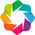

:Bars   [accident_year,accident_severity]   (count)

In [13]:
import polars as pl
import hvplot.polars  # Ensures that hvplot is used with Polars
import holoviews as hv

# Initialize Holoviews with the Bokeh backend
hv.extension('bokeh')

# Assuming accidents_df is your Polars DataFrame
# Group the data by year and accident severity, and count occurrences
severity_counts = (
    accidents_df.group_by(['accident_year', 'accident_severity'])
    .agg(count=pl.len())
    .sort(['accident_year', 'accident_severity'])
)

# Define a color palette for severity levels
color_palette = ['#FFA07A', '#98FB98', '#87CEFA']  # Light Salmon, Pale Green, Light Sky Blue

# Create a stacked bar chart
stacked_bar = severity_counts.hvplot.bar(
    x='accident_year',
    y='count',
    by='accident_severity',
    stacked=True,
    title='Accident Severity Counts by Year',
    xlabel='Year',
    ylabel='Number of Accidents',
    height=500,
    width=800,
    legend='top_right',
    color=color_palette
)

# Improve the styling
stacked_bar = stacked_bar.opts(
    hv.opts.Bars(
        line_color='white',
        line_width=0.5,
        tools=['hover'],
        xrotation=45,
    ),
    hv.opts.Overlay(
        width=800,
        height=500,
        xformatter='%d',
        yformatter='%.0f',
        toolbar='above',
        show_grid=True,
    )
)

# Display the plot
stacked_bar


In [ ]:
# Layout the toggle buttons and the dynamic chartimport polars as pl
import hvplot.polars
import panel as pn
import holoviews as hv

hv.extension('bokeh')

# Assuming accidents_df is your Polars DataFrame and is already loaded

# Group the data by year and accident severity, and count occurrences
severity_counts = (
    accidents_df.group_by(['accident_year', 'accident_severity'])
    .agg(pl.count('accident_index').alias('count'))  # Ensure we have the count column
    .sort(['accident_year', 'accident_severity'])
)

# Toggle buttons for selecting accident severity
severity_toggle = pn.widgets.ToggleGroup(
    name='Accident Severity', 
    options=[1, 2, 3],  # Use integers for severity levels
    value=[1, 2, 3],     # Default to all selected
    button_type='success'
)

# Define a color palette for severity levels
color_palette = {1: '#FFA07A', 2: '#FFD700', 3: '#98FB98'}  # Example colors: Light Salmon, Gold, Pale Green

# Function to create the chart based on selected severities
@pn.depends(severity_toggle.param.value)
def filtered_chart(severity_levels):
    # Check if all options are deselected
    if not severity_levels:
        severity_toggle.value   = [1, 2, 3]  # Reset to initial state
        severity_levels         = [1, 2, 3]
    
    filtered_data = severity_counts.filter(pl.col('accident_severity').is_in(severity_levels))
    return filtered_data.hvplot.bar(
        x='accident_year',
        y='count',
        by='accident_severity',
        stacked=True,
        title='Accident Severity Counts by Year',
        xlabel='Year',
        ylabel='Number of Accidents',
        height=500,
        width=800,
        color=[color_palette[sev] for sev in severity_levels]
    ).opts(
        hv.opts.Bars(
            line_color='white', 
            line_width=0.5,
            tools=['hover'], 
            hover_fill_color='black'
        )
    )

# Layout the toggle buttons and the dynamic chart
layout = pn.Column(severity_toggle, filtered_chart)

# Display the interactive plot
layout.servable()

layout = pn.Column(severity_toggle, filtered_chart)

# Display the interactive plot
layout.servable()


# A Lot?

In [15]:
plot_configs = {
    "severity_by_year": {
        "x": "accident_year",
        "y": "count",
        "by": "accident_severity",
        "kind": "bar",
        "stacked": True,
        "title": "Accident Severity Counts by Year",
        "xlabel": "Year",
        "ylabel": "Number of Accidents",
        "height": 500,
        "width": 800,
        "color": color_palette,
        "line_color": "white",
        "line_width": 0.5,
        "hover_fill_color": "lightblue"
    },
    "casualties_by_road_type": {
        "x": "accident_severity",
        "y": "number_of_casualties",
        "by": "road_type",
        "kind": "bar",
        "stacked": True,
        "title": "Casualties by Road Type and Severity",
        "xlabel": "Road Type",
        "ylabel": "Number of Casualties",
        "height": 500,
        "width": 800,
        "color": color_palette
    },
    # Add other plot configurations as needed
}


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
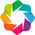

BokehModel(combine_events=True, render_bundle={'docs_json': {'6ac8e29c-2ab0-4e13-b303-73cceb625341': {'version…

UnknownReferenceError: can't resolve reference 'p3703'

UnknownReferenceError: can't resolve reference 'p3703'

UnknownReferenceError: can't resolve reference 'p3703'

UnknownReferenceError: can't resolve reference 'p3703'

UnknownReferenceError: can't resolve reference 'p3763'

UnknownReferenceError: can't resolve reference 'p3763'

UnknownReferenceError: can't resolve reference 'p3763'

UnknownReferenceError: can't resolve reference 'p3763'

UnknownReferenceError: can't resolve reference 'p3825'

UnknownReferenceError: can't resolve reference 'p3825'

UnknownReferenceError: can't resolve reference 'p3825'

UnknownReferenceError: can't resolve reference 'p3825'

In [21]:
import polars as pl
import hvplot.polars
import panel as pn
import holoviews as hv

hv.extension('bokeh')

# Assuming accidents_df is your Polars DataFrame and is already loaded

# Function to get unique values from a column and create toggle buttons
def create_toggle_buttons(dataframe, column, name):
    unique_values = dataframe.select(pl.col(column).unique()).to_series().to_list()
    return pn.widgets.ToggleGroup(
        name=name,
        options=unique_values,
        value=unique_values,  # Default to all selected
        button_type='success'
    )

# Define configuration for plots
plot_configs = {
    'severity_by_year': {
        'x': 'accident_year',   
        'y': 'count',
        'by': 'accident_severity',
        'kind': 'bar',
        'stacked': True,
        'height': 500,
        'width': 800,
        'title': 'Accident Severity Counts by Year',
        'xlabel': 'Year',
        'ylabel': 'Number of Accidents',
        'color': {1: '#FFA07A', 2: '#FFD700', 3: '#98FB98'},  # Example colors: Light Salmon, Gold, Pale Green
        'line_color': 'white',
        'line_width': 0.5,
        'tools': ['hover'],
        'hover_fill_color': 'lightblue',
    },
    # Add more configurations for different plots as needed
}

# Create toggle buttons for accident severity
severity_toggle = create_toggle_buttons(accidents_df, 'accident_severity', 'Accident Severity')

# Function to create a plot based on configuration and selected values
@pn.depends(severity_toggle.param.value)
def create_plot(severity_levels):
    # Filter data based on severity levels
    if not severity_levels:
        severity_levels = severity_toggle.options  # Reset to initial state if all deselected
        severity_toggle.value = severity_levels
    
    filtered_data = severity_counts.filter(pl.col('accident_severity').is_in(severity_levels))
    
    config = plot_configs['severity_by_year']
    plot = filtered_data.hvplot.bar(
        x=          config['x'],            y=      config['y'],                by=     config['by'],                
        stacked=    config['stacked'],      height= config['height'],           width=  config['width'],
        title=      config['title'],        xlabel= config['xlabel'],           ylabel= config['ylabel'],
        color=      [config['color'].get(sev, 'gray') for sev in severity_levels],
    ).opts(
        hv.opts.Bars(
            line_color= config['line_color'],   line_width=         config['line_width'],
            tools=      config['tools'],        hover_fill_color=   config['hover_fill_color'],
            xrotation=  45,                     yformatter=         '%.0f' 
        )
    )
    return plot

# Create severity counts DataFrame
severity_counts = (
    accidents_df.group_by(['accident_year', 'accident_severity'])
    .agg(pl.count('accident_index').alias('count'))  # Ensure we have the count column
    .sort(['accident_year', 'accident_severity'])
)

# Layout the toggle buttons and the dynamic chart
layout = pn.Column(severity_toggle, pn.panel(create_plot))

# Display the interactive plot
layout.servable()


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
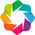

BokehModel(combine_events=True, render_bundle={'docs_json': {'a45a2c12-f23b-4776-a59d-894af4840606': {'version…

In [17]:
import polars as pl
import hvplot.polars
import panel as pn
import holoviews as hv

hv.extension('bokeh')

def get_unique_values(dataframe, column):
    """Extract unique values from a Polars DataFrame column."""
    return dataframe.select(pl.col(column).unique()).to_series().to_list()

def create_controls(dataframe, config):
    controls = {}
    for control, settings in config['controls'].items():
        unique_values = get_unique_values(dataframe, settings['column'])
        if len(unique_values) > 10:
            control_widget = pn.widgets.MultiSelect(name=settings['name'], options=unique_values, value=[unique_values[0]])
        else:
            control_widget = pn.widgets.CheckButtonGroup(name=settings['name'], options=unique_values, value=unique_values)
        controls[control] = control_widget
    return controls

config = {
    'controls': {
        'severity': {
            'column': 'accident_severity', 
            'name': 'Severity Level'
        },
        'weather': {
            'column': 'weather_conditions', 
            'name': 'Weather Condition'
        },
        'road_type': {
            'column': 'road_type', 
            'name': 'Road Type'
        }
    },
    'plot': {
        'x': 'accident_year',
        'y': 'count',
        'by': 'accident_severity',
        'hvplot_args': {'width': 700, 'height': 400, 'kind': 'bar', 'stacked': True},
        'opts_args': {'tools': ['hover'], 'hover_fill_color': 'lightblue'}
    }
}

@pn.cache
def load_data():
    return pl.read_csv('path_to_your_csv_file.csv')

def apply_filters_and_plot(dataframe, controls):
    query = pl.DataFrame()
    for control_name, control_widget in controls.items():
        if control_widget.value:
            query = query.lazy().join(
                pl.DataFrame({config['controls'][control_name]['column']: control_widget.value}).lazy(),
                how='anti'
            )
    
    filtered_data = dataframe.lazy().join(query, how='anti')
    
    grouped_data = (
        filtered_data.groupby(['accident_year', 'accident_severity'])
        .agg(pl.count().alias('count'))
        .collect()
    )
    
    plot = grouped_data.hvplot(**config['plot']['hvplot_args']).opts(**config['plot']['opts_args'])
    return plot

# Create controls and layout
controls = create_controls(accidents_df, config)
plot_pane = pn.pane.HoloViews(height=450, width=700)

@pn.depends(*controls.values())
def update_plot(*args):
    plot = apply_filters_and_plot(accidents_df, controls)
    plot_pane.object = plot

layout = pn.Column(
    pn.Row(*controls.values()),
    plot_pane
)

# Display the interactive plot
layout.servable()

# GEO

In [18]:
# Replace "NULL" with NaN for longitude and latitude
accidents_df = accidents_df.with_columns([
    pl.col('longitude').map_elements(lambda x: None if x == "NULL" else float(x), return_dtype=pl.Float64),
    pl.col('latitude').map_elements(lambda x: None if x == "NULL" else float(x), return_dtype=pl.Float64)

])

In [19]:
null_latitude = accidents_df['latitude'].is_null()
null_longitude = accidents_df['longitude'].is_null()

print(f"Null values in latitude column: {null_latitude.sum()}")
print(f"Null values in longitude column: {null_longitude.sum()}")

Null values in latitude column: 4887431
Null values in longitude column: 4887431


In [20]:
accidents_df.head()

accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,year
str,i64,str,i64,i64,f64,f64,i64,i64,i64,i64,date,i64,time,i64,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i32
"""197901A11AD14""",1979,"""01A11AD14""",null,null,null,null,1,3,2,1,1979-01-18,5,08:00:00,11,"""-1""",-1,3,4,1,30,1,4,-1,-1,-1,-1,1,8,1,-1,0,-1,-1,-1,-1,1979
"""197901A1BAW34""",1979,"""01A1BAW34""",198460,894000,null,null,1,3,1,1,1979-01-01,2,01:00:00,23,"""-1""",-1,6,0,9,30,3,4,-1,-1,-1,-1,4,8,3,-1,0,-1,-1,-1,-1,1979
"""197901A1BFD77""",1979,"""01A1BFD77""",406380,307000,null,null,1,3,2,3,1979-01-01,2,01:25:00,17,"""-1""",-1,3,112,9,30,6,4,-1,-1,-1,-1,4,8,3,-1,0,-1,-1,-1,-1,1979
"""197901A1BGC20""",1979,"""01A1BGC20""",281680,440000,null,null,1,3,2,2,1979-01-01,2,01:30:00,2,"""-1""",-1,3,502,12,30,3,2,-1,-1,-1,-1,4,8,3,-1,0,-1,-1,-1,-1,1979
"""197901A1BGF95""",1979,"""01A1BGF95""",153960,795000,null,null,1,2,2,1,1979-01-01,2,01:30:00,510,"""-1""",-1,3,309,6,30,0,-1,0,-1,-1,-1,4,3,3,-1,0,-1,-1,-1,-1,1979


In [21]:

# Fill NaN values if necessary
accidents_df = accidents_df.fill_null('NA')

In [22]:
accidents_df = accidents_df.filter(pl.col('date').dt.year() == 2000)

In [23]:
# Check the first few rows of longitude and latitude to ensure they are valid
accidents_df.select(['longitude', 'latitude']).head()

longitude,latitude
f64,f64
-0.232572,51.688371
-0.03211,51.726908
-0.271588,51.723752
-0.253731,51.706222
-0.218557,51.684203


In [24]:
accidents_df.describe()

statistic,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,year
str,str,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,str,f64,str,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""count""","""233729""",233729.0,"""233729""",232848.0,232848.0,232848.0,232848.0,233729.0,233729.0,233729.0,233729.0,"""233729""",233729.0,"""233729""",233729.0,"""233729""",0.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,233729.0,25864.0,233729.0
"""null_count""","""0""",0.0,"""0""",881.0,881.0,881.0,881.0,0.0,0.0,0.0,0.0,"""0""",0.0,"""0""",0.0,"""0""",233729.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207865.0,0.0
"""mean""",null,2000.0,null,439594.634526,299371.905406,-1.437932,52.582577,29.463015,2.834359,1.839494,1.370318,"""2000-07-05""",4.136577,"""14:09:13.878893""",340.555661,null,null,4.088615,842.440412,5.430593,39.394684,2.454103,1.838608,3.114436,225.807332,0.006713,0.6439,1.959996,1.531633,1.43781,0.071844,0.089514,1.34721,1.121962,1.609544,-1.0,2000.0
"""std""",null,0.0,null,93683.560612,157961.074022,1.378093,1.422347,25.609827,0.405955,0.718087,0.871918,null,1.943247,null,259.82054,null,null,1.432962,1661.055872,1.957756,14.244139,2.607923,2.34754,2.7771,960.976333,0.110279,1.721317,1.633401,1.460659,0.688971,0.535778,0.597102,0.487987,0.689521,0.93651,0.0,0.0
"""min""","""2000010SU0982""",2000.0,"""010SU0982""",75500.0,10300.0,-7.390579,49.913061,1.0,1.0,1.0,1.0,"""2000-01-01""",1.0,"""00:00:00""",1.0,"""E06000001""",null,1.0,-1.0,1.0,20.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,2000.0
"""25%""",null,2000.0,null,377100.0,179300.0,-2.344464,51.499911,6.0,3.0,1.0,1.0,"""2000-04-05""",2.0,"""10:30:00""",106.0,null,null,3.0,0.0,6.0,30.0,0.0,-1.0,0.0,-1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,2.0,-1.0,2000.0
"""50%""",null,2000.0,null,438890.0,270710.0,-1.418629,52.324246,23.0,3.0,2.0,1.0,"""2000-07-08""",4.0,"""14:50:00""",305.0,null,null,3.0,41.0,6.0,30.0,3.0,4.0,3.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,2.0,-1.0,2000.0
"""75%""",null,2000.0,null,523350.0,396560.0,-0.217976,53.46421,45.0,3.0,2.0,1.0,"""2000-10-08""",6.0,"""17:55:00""",512.0,null,null,6.0,595.0,6.0,50.0,3.0,4.0,6.0,0.0,0.0,0.0,4.0,1.0,2.0,0.0,0.0,2.0,1.0,2.0,-1.0,2000.0
"""max""","""2000984052300""",2000.0,"""984052300""",655290.0,1.2097e6,1.758391,60.765477,98.0,3.0,21.0,90.0,"""2000-12-31""",7.0,"""23:59:00""",941.0,"""W06000024""",null,6.0,9700.0,12.0,70.0,9.0,4.0,6.0,9981.0,2.0,8.0,7.0,9.0,7.0,5.0,5.0,3.0,2.0,2.0,-1.0,2000.0


In [26]:
# Plotting to visualize the locations, assuming 'longitude' and 'latitude' are your geo columns
plot = accidents_df.hvplot.points('longitude', 'latitude', geo=True, tiles='OSM', hover_cols=['date', 'time'])
plot

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (date,time)

# Key Mapping

In [7]:
key_mapping_file = "roadsafetykey.csv"

In [8]:
import polars as pl

# Load the key mapping file
key_mapping_df = pl.read_csv("roadsafetykey.csv", separator=";")

# Prepare the mapping dictionary for each attribute
mapping_dict = {}
for attribute in key_mapping_df["Attribute"].unique():
    filtered_df = key_mapping_df.filter(pl.col("Attribute") == attribute)
    codes_labels = filtered_df.select(["Code", "Label"]).to_pandas()  # Convert to Pandas for simplicity
    mapping_dict[attribute] = dict(zip(codes_labels["Code"], codes_labels["Label"]))


In [9]:
from pprint import pprint as pp
# pp(mapping_dict)

# Y2K+

In [10]:
accidents_df = accidents_df.filter(pl.col('date').dt.year() >= 2000)

In [11]:
accidents_df = accidents_df.with_columns([
    pl.col("date").dt.combine(pl.col("time")).alias("datetime")
])


In [12]:
# Define a function to map months to UK-specific seasons
def map_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'

In [14]:
# Apply the function to create a 'season' column
accidents_df = accidents_df.with_columns([
    pl.col("datetime").dt.hour().alias("hour_of_day"),
    pl.col("datetime").dt.month().alias("month"),
    pl.col("month").map_elements(map_season, return_dtype=pl.Utf8).alias("season")
])


In [ ]:
# accidents_df.columns

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
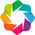

BokehModel(combine_events=True, render_bundle={'docs_json': {'fbf14d4e-6549-4031-99ea-21657d43649e': {'version…

In [41]:
import polars as pl
import hvplot.polars
import panel as pn
import holoviews as hv

hv.extension('bokeh')

# RadioButtonGroup for selecting the time period with custom styling
time_period_toggle = pn.widgets.RadioButtonGroup(
    name='Time Period',
    options=['Hour of Day', 'Day of Week', 'Month'],
    value='Hour of Day',
    button_type='primary'
)

# CheckBoxGroup for selecting accident severity with custom styling
severity_toggle = pn.widgets.CheckBoxGroup(
    name='Accident Severity',
    options=[1, 2, 3],
    value=[1, 2, 3],
    inline=True
)

# CheckBoxGroup for selecting the season with multi-select and custom styling
season_toggle = pn.widgets.CheckBoxGroup(
    name='Season',
    options=['Winter', 'Spring', 'Summer', 'Autumn'],
    value=['Winter', 'Spring', 'Summer', 'Autumn'],
    inline=True
)

# IntRangeSlider for selecting a year range
year_range_slider = pn.widgets.IntRangeSlider(
    name='Year Range',
    start=int(accidents_df['accident_year'].min()),
    end=int(accidents_df['accident_year'].max()),
    value=(int(accidents_df['accident_year'].min()), int(accidents_df['accident_year'].max())),
    step=1,
    bar_color='blue'
)

# Toggle to switch between year range and single year selection
single_year_toggle = pn.widgets.Toggle(name='Single Year Mode', value=False, button_type='primary')

# Synchronize single year toggle with range slider
@pn.depends(single_year_toggle.param.value, watch=True)
def update_slider_mode(active):
    if active:
        year_range_slider.mode = 'single'
        year_range_slider.bar_color = 'red'
    else:
        year_range_slider.mode = 'range'
        year_range_slider.bar_color = 'blue'

# Function to filter data based on controls
def get_filtered_data(severity, seasons, year_range):
    df = accidents_df.filter(
        (pl.col('accident_year') >= year_range[0]) & 
        (pl.col('accident_year') <= year_range[1]) & 
        (pl.col('season').is_in(seasons)) & 
        (pl.col('accident_severity').is_in(severity))
    )
    return df

# Function to create the chart based on selected options
@pn.depends(time_period_toggle.param.value, severity_toggle.param.value, season_toggle.param.value, year_range_slider.param.value)
def filtered_chart(time_period, severity, seasons, year_range):
    filtered_data = get_filtered_data(severity, seasons, year_range)
    group_col = {'Hour of Day': 'hour_of_day', 'Day of Week': 'day_of_week', 'Month': 'month'}[time_period]
    
    time_data = (
        filtered_data.group_by([group_col, 'accident_severity'])
        .agg(pl.count('accident_index').alias('count'))
        .sort([group_col, 'accident_severity'])
    )

    return time_data.hvplot.bar(
        x=group_col,
        y='count',
        by='accident_severity',
        stacked=True,
        title=f'Accident Severity Distribution by {time_period} for {", ".join(seasons)} from {year_range[0]} to {year_range[1]}',
        xlabel=time_period,
        ylabel='Number of Accidents',
        height=500,
        width=800
    ).opts(
        hv.opts.Bars(
            line_color='white', 
            line_width=0.5, 
            tools=['hover'], 
            hover_fill_color='black'
        )
    )

# Layout the toggle buttons and the dynamic chart with custom styling
layout = pn.Column(
    pn.Row(time_period_toggle, season_toggle, severity_toggle),
    pn.Row(year_range_slider, single_year_toggle),
    filtered_chart
)

# Display the interactive plot
layout.servable()
